# **Semantic Segmentation**

## **Configuration**

Import of libraries

In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import TensorBoard
import pathlib

Define location of data

In [4]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


Root dir:

In [5]:
root_dir = "/content/drive/My Drive/"
personal_dir = 'Repo_Tesis/' 
base_dir = root_dir + personal_dir
print(base_dir)

/content/drive/My Drive/Repo_Tesis/


## **U-Net**

- This code block sets up a dataset of images and corresponding masks for a computer vision task.
The images and masks are read in from files stored in two separate directories, which are specified using the pathlib.Path() function.
- The images and masks are read in as PNG files using TensorFlow's IO library.
- The code then defines a function to preprocess the images and masks by normalizing their pixel values to the range [0, 1].
- This function is applied to each image-mask pair in the dataset using the dataset.map() method.
- Finally, the dataset is split into training, validation, and testing subsets using the take() and skip() methods based on user-specified proportions of the total dataset size.

In [6]:
# ruta a las carpetas de imágenes y máscaras
data_dir = pathlib.Path('/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/')
images_dir = data_dir / 'RGB'
masks_dir = data_dir / 'MASK'

# obtener una lista de rutas de archivo para imágenes y máscaras
image_paths = sorted([str(path) for path in images_dir.glob('*.png')])
mask_paths = sorted([str(path) for path in masks_dir.glob('*.png')])

# crear un dataset a partir de las rutas de archivo
dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))

# definir una función para cargar y preprocesar las imágenes y máscaras
def load_and_preprocess_image(image_path, mask_path):
    # cargar la imagen y máscara
    image = tf.io.decode_png(tf.io.read_file(image_path))
    mask = tf.io.decode_png(tf.io.read_file(mask_path), channels=1)
    
    # normalizar la imagen y máscara
    image = tf.cast(image, tf.float32) / 255.0
    mask = tf.cast(mask, tf.float32) / 255.0
    
    return image, mask

# aplicar la función de carga y preprocesamiento a cada par de rutas de archivo en el dataset
dataset = dataset.map(load_and_preprocess_image)

# dividir el dataset en conjuntos de entrenamiento, validación y prueba
total_samples = len(image_paths)
train_size = int(0.7 * total_samples)
val_size = int(0.15 * total_samples)
test_size = total_samples - train_size - val_size

train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size).take(val_size)
test_dataset = dataset.skip(train_size + val_size).take(test_size)

In [8]:
BATCH_SIZE = 16
BUFFER_SIZE = 100

- train_dataset is first divided into batches using the batch() method, with the specified batch size BATCH_SIZE.
- The cache() method is then applied to the resulting batches, which will cache them in memory to improve training performance.
- The shuffle() method is also applied to the batches, which will shuffle them randomly before each epoch of training. The BUFFER_SIZE parameter determines the number of elements to use for shuffling.
- The resulting batches are then repeated indefinitely using the repeat() method, allowing for multiple epochs of training.
- The prefetch() method is applied to the batches, which will prefetch a certain number of batches in the background while the current batch is being processed, thus reducing training time.
- Similarly, test_dataset is divided into batches using the batch() method with the same BATCH_SIZE, and validation_batches is assigned to the resulting batches.
- test_batches is assigned to test_dataset divided into batches using the same batch() method and BATCH_SIZE.

In [9]:
train_batches = train_dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_batches = train_batches.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
validation_batches = test_dataset.batch(BATCH_SIZE)
test_batches = test_dataset.batch(BATCH_SIZE)

In [10]:
print(train_size, val_size,test_size)

2606 558 560


In [11]:
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ["Input Image", "True Mask", "Predicted Mask"]

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.utils.array_to_img(display_list[i]))
    plt.axis("off")
  plt.show()

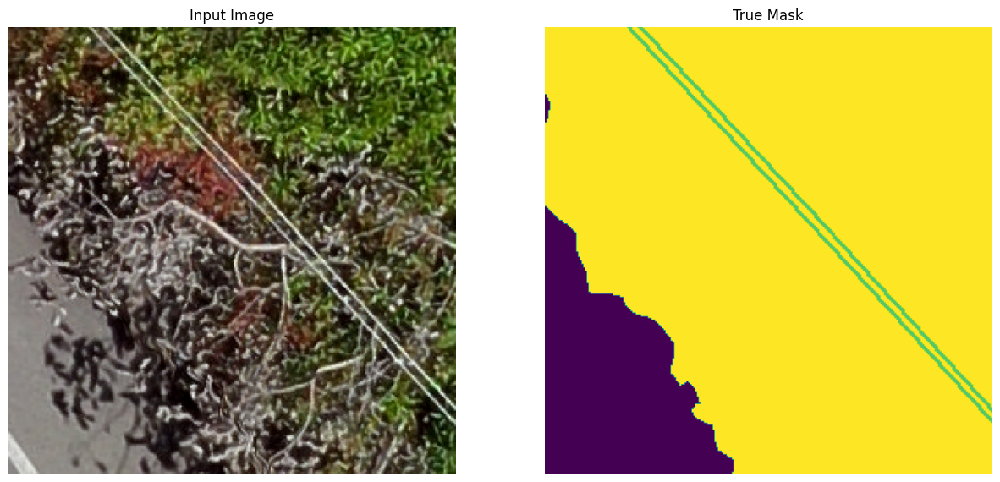

In [12]:
sample_batch = next(iter(train_batches))
random_index = np.random.choice(sample_batch[0].shape[0])
sample_image, sample_mask = sample_batch[0][random_index], sample_batch[1][random_index]
display([sample_image, sample_mask])

### **Architecture**

We created a U-Net model for image segmentation using Keras Functional API. Here are the main steps:

Created a function double_conv_block which performs Conv2D, BatchNormalization, ReLU activation, and dropout.
Created a function downsample_block which downsamples the input tensor using double_conv_block and MaxPooling.
Created a function upsample_block which upsamples the input tensor using Conv2DTranspose, concatenates it with the corresponding tensor from the contracting path, applies dropout, and then applies double_conv_block.
Created the U-Net model using the above functions and Keras Functional API.
The U-Net model takes an input tensor of shape (256,256,3) and applies four downsample blocks to it.
A bottleneck block is then applied which consists of two double_conv_blocks with dropout.
The upsample blocks are then applied to the output of the bottleneck block in reverse order of the downsample blocks.
The output of the model is a tensor of shape (256,256,3) which is obtained by applying a Conv2D layer with softmax activation to the output of the last upsample block.

In [23]:
def double_conv_block(x, n_filters):

    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", kernel_initializer = "he_normal")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", kernel_initializer = "he_normal")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    # Conv2D then ReLU activation
    x = layers.Conv2D(n_filters, 3, padding = "same", kernel_initializer = "he_normal")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)
    # dropout
    x = layers.Dropout(0.3)(x)

    return x

def downsample_block(x, n_filters):
    f = double_conv_block(x, n_filters)
    p = layers.MaxPool2D(2)(f)
    p = layers.Dropout(0.3)(p)

    return f, p

def upsample_block(x, conv_features, n_filters):
    # upsample
    x = layers.Conv2DTranspose(n_filters, 3, 2, padding="same")(x)
    # concatenate 
    x = layers.concatenate([x, conv_features])
    # dropout
    x = layers.Dropout(0.3)(x)
    # Conv2D twice with ReLU activation
    x = double_conv_block(x, n_filters)

    return x
    
def build_unet_model():

    # inputs
    inputs = layers.Input(shape=(256,256,3))

    # encoder: contracting path - downsample
    # 1 - downsample
    f1, p1 = downsample_block(inputs, 64)
    # 2 - downsample
    f2, p2 = downsample_block(p1, 128)
    # 3 - downsample
    f3, p3 = downsample_block(p2, 256)
    # 4 - downsample
    f4, p4 = downsample_block(p3, 512)

    # 5 - bottleneck
    bottleneck = double_conv_block(p4, 1024)
    bottleneck = layers.Dropout(0.5)(bottleneck)

    # decoder: expanding path - upsample
    # 6 - upsample
    u6 = upsample_block(bottleneck, f4, 512)
    # 7 - upsample
    u7 = upsample_block(u6, f3, 256)
    # 8 - upsample
    u8 = upsample_block(u7, f2, 128)
    # 9 - upsample
    u9 = upsample_block(u8, f1, 64)

    # outputs
    outputs = layers.Conv2D(3, 1, padding="same", activation = "softmax")(u9)

    # unet model with Keras Functional API
    unet_model = tf.keras.Model(inputs, outputs, name="U-Net")

    return unet_model

In [24]:
unet_model = build_unet_model()
unet_model.summary()

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_19 (Conv2D)             (None, 256, 256, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d_19[0][0]']              
 alization)                     )                                                             

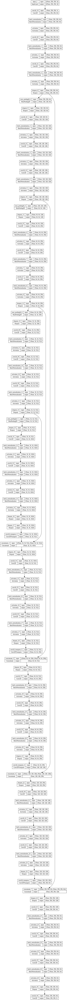

In [25]:
tf.keras.utils.plot_model(unet_model, show_shapes=True)

In [26]:
unet_model.compile(optimizer=tf.keras.optimizers.Adam(),
                   loss="sparse_categorical_crossentropy",
                   metrics=["accuracy"])

In [27]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Then training

In [28]:
NUM_EPOCHS = 10
BATCH_SIZE = 16


STEPS_PER_EPOCH = total_samples // BATCH_SIZE

VAL_SUBSPLITS = 5
VALIDATION_STEPS = test_size // BATCH_SIZE // VAL_SUBSPLITS

tensorboard = TensorBoard(log_dir='logs/semantic_segmentation')
model_history = unet_model.fit(train_batches,
                               epochs=NUM_EPOCHS,
                               steps_per_epoch=STEPS_PER_EPOCH,
                               validation_steps=VALIDATION_STEPS,
                               validation_data=validation_batches,
                               callbacks=[tensorboard])

Epoch 1/10
232/232 [==============================] - 450s 2s/step - loss: 0.1116 - accuracy: 0.4855 - val_loss: 0.0184 - val_accuracy: 0.5515
Epoch 2/10
232/232 [==============================] - 413s 2s/step - loss: 0.0077 - accuracy: 0.4845 - val_loss: 0.0025 - val_accuracy: 0.5515
Epoch 3/10
232/232 [==============================] - 416s 2s/step - loss: 0.0031 - accuracy: 0.5013 - val_loss: 8.9133e-04 - val_accuracy: 0.5515
Epoch 4/10
232/232 [==============================] - 416s 2s/step - loss: 0.0017 - accuracy: 0.4946 - val_loss: 4.4124e-04 - val_accuracy: 0.5515
Epoch 5/10
232/232 [==============================] - 416s 2s/step - loss: 0.0011 - accuracy: 0.4885 - val_loss: 2.6873e-04 - val_accuracy: 0.5515
Epoch 6/10
232/232 [==============================] - 416s 2s/step - loss: 7.4175e-04 - accuracy: 0.4996 - val_loss: 1.6241e-04 - val_accuracy: 0.5515
Epoch 7/10
232/232 [==============================] - 416s 2s/step - loss: 5.4175e-04 - accuracy: 0.4896 - val_loss: 1.130

KeyboardInterrupt: ignored

In [19]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### **Visualization of predicion**

In [21]:
def create_mask(pred_mask):
  pred_mask = tf.argmax(pred_mask, axis=-1)
  pred_mask = pred_mask[..., tf.newaxis]
  return pred_mask[0]

def show_predictions(dataset=None, num=1):
  if dataset:
    for image, mask in dataset.take(num):
      pred_mask = unet_model.predict(image)
      display([image[0], mask[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

1/1 [==============================] - 0s 308ms/step


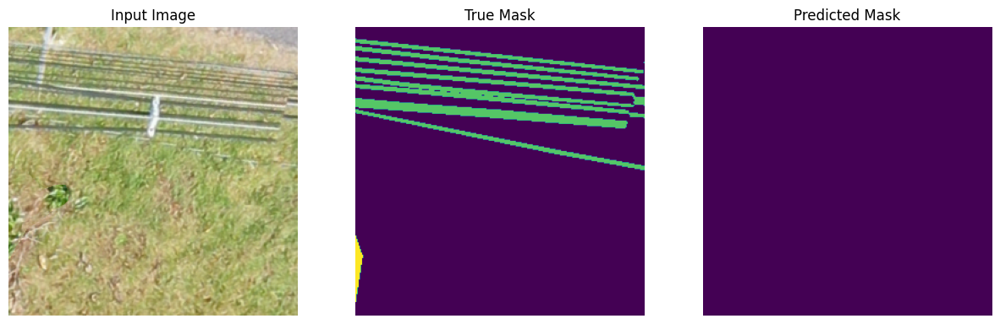

1/1 [==============================] - 0s 33ms/step


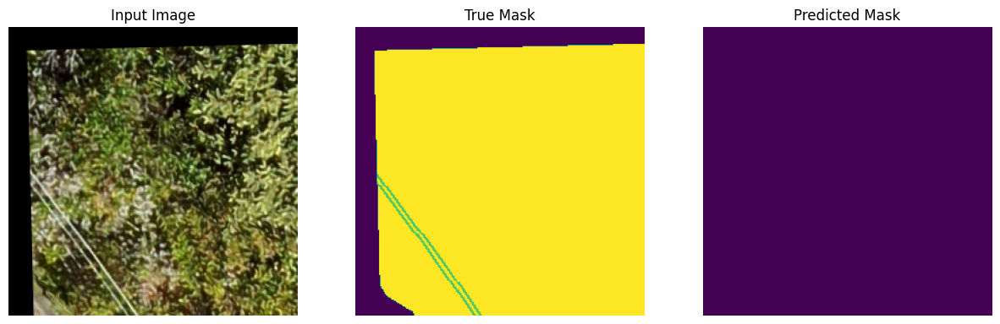

1/1 [==============================] - 0s 39ms/step


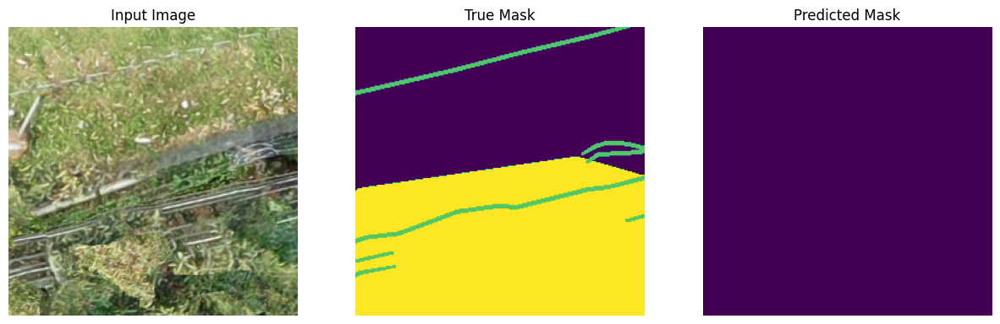

1/1 [==============================] - 0s 26ms/step


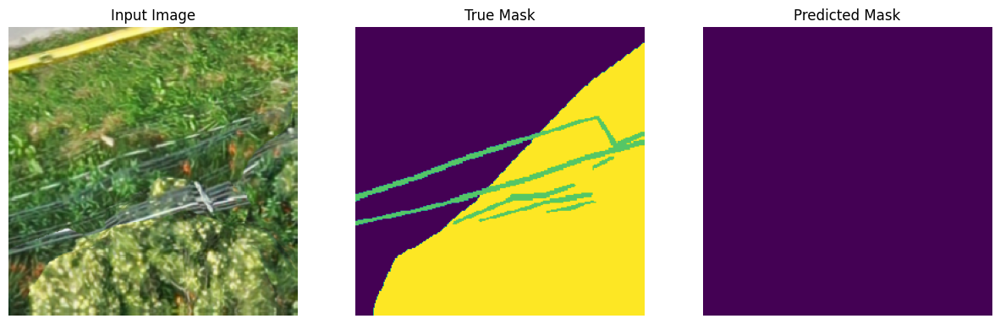

1/1 [==============================] - 0s 44ms/step


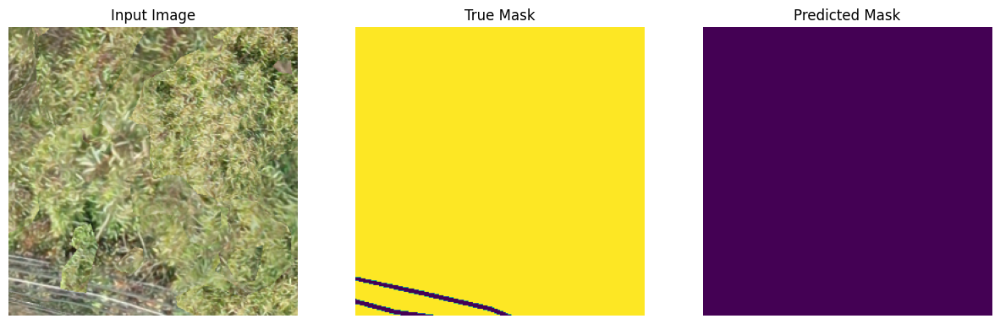

In [22]:
show_predictions(test_batches.skip(5), 5)

In [ ]:
!pip install keras_segmentation

## **Other approaches U-net**

Using `keras_segmentation.models.unet`

In [32]:
from keras_segmentation.models.unet import unet
model = unet(n_classes=3 ,  input_height=320, input_width=320)

In [ ]:
model.train(
    train_images =  "/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB",
    train_annotations = "/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK",
    checkpoints_path = "/tmp/unet_1" , epochs=20  
)

Using this tutorial: https://keras.io/examples/vision/oxford_pets_image_segmentation/

In [6]:
import os

input_dir = "/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/"
target_dir = "/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/"
img_size = (256, 256)
num_classes = 3
batch_size = 32

input_img_paths = sorted(
    [
        os.path.join(input_dir, fname)
        for fname in os.listdir(input_dir)
        if fname.endswith(".png")
    ]
)
target_img_paths = sorted(
    [
        os.path.join(target_dir, fname)
        for fname in os.listdir(target_dir)
        if fname.endswith(".png") and not fname.startswith(".")
    ]
)

print("Number of samples:", len(input_img_paths))

for input_path, target_path in zip(input_img_paths[:10], target_img_paths[:10]):
    print(input_path, "|", target_path)

Number of samples: 3724
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100_0.png | /content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/100_0.png
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100_1.png | /content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/100_1.png
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100_2.png | /content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/100_2.png
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100_3.png | /content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/100_3.png
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100_4.png | /content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/MASK/100_4.png
/content/drive/My Drive/Repo_Tesis/TESELLATED_WITH_GEOMETRIC_AUGMENTATION/RGB/100

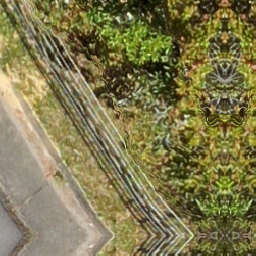

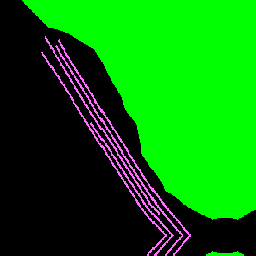

In [7]:
from IPython.display import Image, display
from tensorflow.keras.preprocessing.image import load_img
from PIL import ImageOps

# Display input image #7
display(Image(filename=input_img_paths[9]))

# Display auto-contrast version of corresponding target (per-pixel categories)
img = ImageOps.autocontrast(load_img(target_img_paths[9]))
display(img)

In [8]:
from tensorflow import keras
import numpy as np
from tensorflow.keras.preprocessing.image import load_img


class VegetationEnchroachment(keras.utils.Sequence):
    """Helper to iterate over the data (as Numpy arrays)."""

    def __init__(self, batch_size, img_size, input_img_paths, target_img_paths):
        self.batch_size = batch_size
        self.img_size = img_size
        self.input_img_paths = input_img_paths
        self.target_img_paths = target_img_paths

    def __len__(self):
        return len(self.target_img_paths) // self.batch_size

    def __getitem__(self, idx):
        """Returns tuple (input, target) correspond to batch #idx."""
        i = idx * self.batch_size
        batch_input_img_paths = self.input_img_paths[i : i + self.batch_size]
        batch_target_img_paths = self.target_img_paths[i : i + self.batch_size]
        x = np.zeros((self.batch_size,) + self.img_size + (3,), dtype="float32")
        for j, path in enumerate(batch_input_img_paths):
            img = load_img(path, target_size=self.img_size)
            x[j] = img
        y = np.zeros((self.batch_size,) + self.img_size + (1,), dtype="uint8")
        for j, path in enumerate(batch_target_img_paths):
            img = load_img(path, target_size=self.img_size, color_mode="grayscale")
            y[j] = np.expand_dims(img, 2)
            # Ground truth labels are 1, 2, 3. Subtract one to make them 0, 1, 2:
        return x, y

In [9]:
from tensorflow.keras import layers


def get_model(img_size, num_classes):
    inputs = keras.Input(shape=img_size + (3,))

    ### [First half of the network: downsampling inputs] ###

    # Entry block
    x = layers.Conv2D(32, 3, strides=2, padding="same")(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    previous_block_activation = x  # Set aside residual

    # Blocks 1, 2, 3 are identical apart from the feature depth.
    for filters in [64, 128, 256]:
        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.SeparableConv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.MaxPooling2D(3, strides=2, padding="same")(x)

        # Project residual
        residual = layers.Conv2D(filters, 1, strides=2, padding="same")(
            previous_block_activation
        )
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    ### [Second half of the network: upsampling inputs] ###

    for filters in [256, 128, 64, 32]:
        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.Activation("relu")(x)
        x = layers.Conv2DTranspose(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)

        x = layers.UpSampling2D(2)(x)

        # Project residual
        residual = layers.UpSampling2D(2)(previous_block_activation)
        residual = layers.Conv2D(filters, 1, padding="same")(residual)
        x = layers.add([x, residual])  # Add back residual
        previous_block_activation = x  # Set aside next residual

    # Add a per-pixel classification layer
    outputs = layers.Conv2D(num_classes, 3, activation="softmax", padding="same")(x)

    # Define the model
    model = keras.Model(inputs, outputs)
    return model


# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()

# Build model
model = get_model(img_size, num_classes)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 32  128        ['conv2d[0][0]']                 
 alization)                     )                                                             

In [10]:
import random

# Split our img paths into a training and a validation set
val_samples = round(len(input_img_paths)*0.2)
random.Random(1337).shuffle(input_img_paths)
random.Random(1337).shuffle(target_img_paths)
train_input_img_paths = input_img_paths[:-val_samples]
train_target_img_paths = target_img_paths[:-val_samples]
val_input_img_paths = input_img_paths[-val_samples:]
val_target_img_paths = target_img_paths[-val_samples:]

# Instantiate data Sequences for each split
train_gen = VegetationEnchroachment(
    batch_size, img_size, train_input_img_paths, train_target_img_paths
)
val_gen = VegetationEnchroachment(batch_size, img_size, val_input_img_paths, val_target_img_paths)

In [11]:
# Configure the model for training.
# We use the "sparse" version of categorical_crossentropy
# because our target data is integers.
model.compile(optimizer="rmsprop", loss="sparse_categorical_crossentropy")

callbacks = [
    keras.callbacks.ModelCheckpoint("VegetationEnchroachment.h5", save_best_only=True)
]

# Train the model, doing validation at the end of each epoch.
epochs = 15
model.fit(train_gen, epochs=epochs, validation_data=val_gen, callbacks=callbacks)

Epoch 1/15


InvalidArgumentError: ignored

23/23 [==============================] - 6s 225ms/step


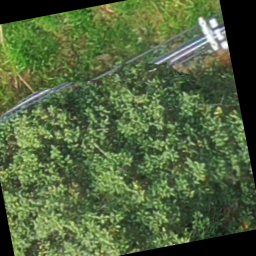

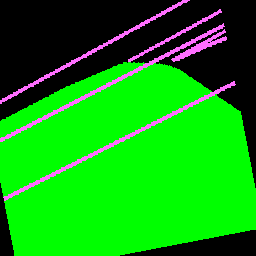

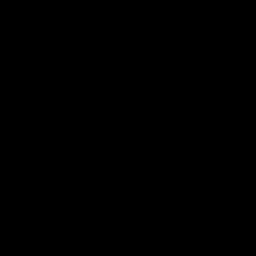

In [48]:
# Generate predictions for all images in the validation set

val_gen = VegetationEnchroachment(batch_size, img_size, val_input_img_paths, val_target_img_paths)
val_preds = model.predict(val_gen)


def display_mask(i):
    """Quick utility to display a model's prediction."""
    mask = np.argmax(val_preds[i], axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    img = ImageOps.autocontrast(keras.preprocessing.image.array_to_img(mask))
    display(img)


# Display results for validation image #10
i = 10

# Display input image
display(Image(filename=val_input_img_paths[i]))

# Display ground-truth target mask
img = ImageOps.autocontrast(load_img(val_target_img_paths[i]))
display(img)

# Display mask predicted by our model
display_mask(i)  # Note that the model only sees inputs at 150x150.